## ML Projects ##
1. Linear Regression
2. Decision Tree Regressor
3. Lasso Regression
4. KNN Regressor
5. RandomForestRegressor
6. Xgboost Regressor
7. Hyperparameter Tuning
8. ANN - Artificial Neural Network

In [2]:
!pip install pandas
!pip install numpy
!pip install matplotlib

  Using cached tzdata-2024.2-py2.py3-none-any.whl.metadata (1.4 kB)
   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 11.3/11.3 MB 17.7 MB/s eta 0:00:0000:010:01
   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 5.1/5.1 MB 19.3 MB/s eta 0:00:00a 0:00:01
Using cached tzdata-2024.2-py2.py3-none-any.whl (346 kB)
  Using cached cycler-0.12.1-py3-none-any.whl.metadata (3.8 kB)
   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 7.8/7.8 MB 14.7 MB/s eta 0:00:00a 0:00:01
Using cached cycler-0.12.1-py3-none-any.whl (8.3 kB)
   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 2.8/2.8 MB 15.9 MB/s eta 0:00:00
   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 3.0/3.0 MB 16.0 MB/s eta 0:00:00


In [3]:
#Import necessary libraries and packages
import pandas as pd
import numpy as np
import matplotlib.pyplot as plt

Matplotlib is building the font cache; this may take a moment.


In [5]:
!pip install seaborn

  Using cached seaborn-0.13.2-py3-none-any.whl.metadata (5.4 kB)
Using cached seaborn-0.13.2-py3-none-any.whl (294 kB)


In [6]:
import seaborn as sns

In [7]:
#load dataframe
df = pd.read_csv('Preprocessed-Data/Real_Combine.csv')

In [8]:
df.isnull().sum() #PM 2.5 has 1 missing values

T         0
TM        0
Tm        0
SLP       0
H         0
W         0
V         0
VM        0
PM 2.5    1
dtype: int64

<Axes: >

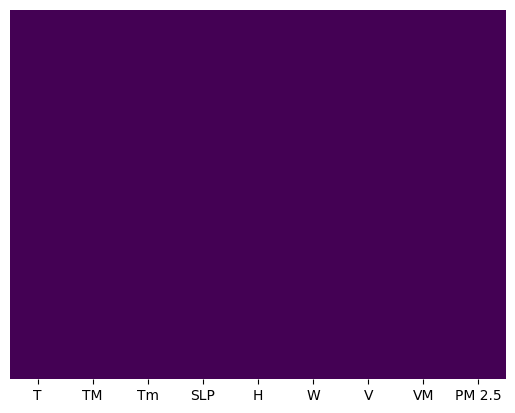

In [9]:
#check fpr null values using heatmap
sns.heatmap(df.isnull(), yticklabels=False, cbar=False, cmap='viridis')

In [10]:
#drop the null values
df = df.dropna()

In [11]:
#Divide the data into independent and dependent features
X = df.iloc[:,:-1] #independent features
y = df.iloc[:,-1] #dependent feature

In [12]:
#Check null values in X:
X.isnull().sum() #no null values in X

T      0
TM     0
Tm     0
SLP    0
H      0
W      0
V      0
VM     0
dtype: int64

In [13]:
y.isnull().sum() #no null values in y

np.int64(0)

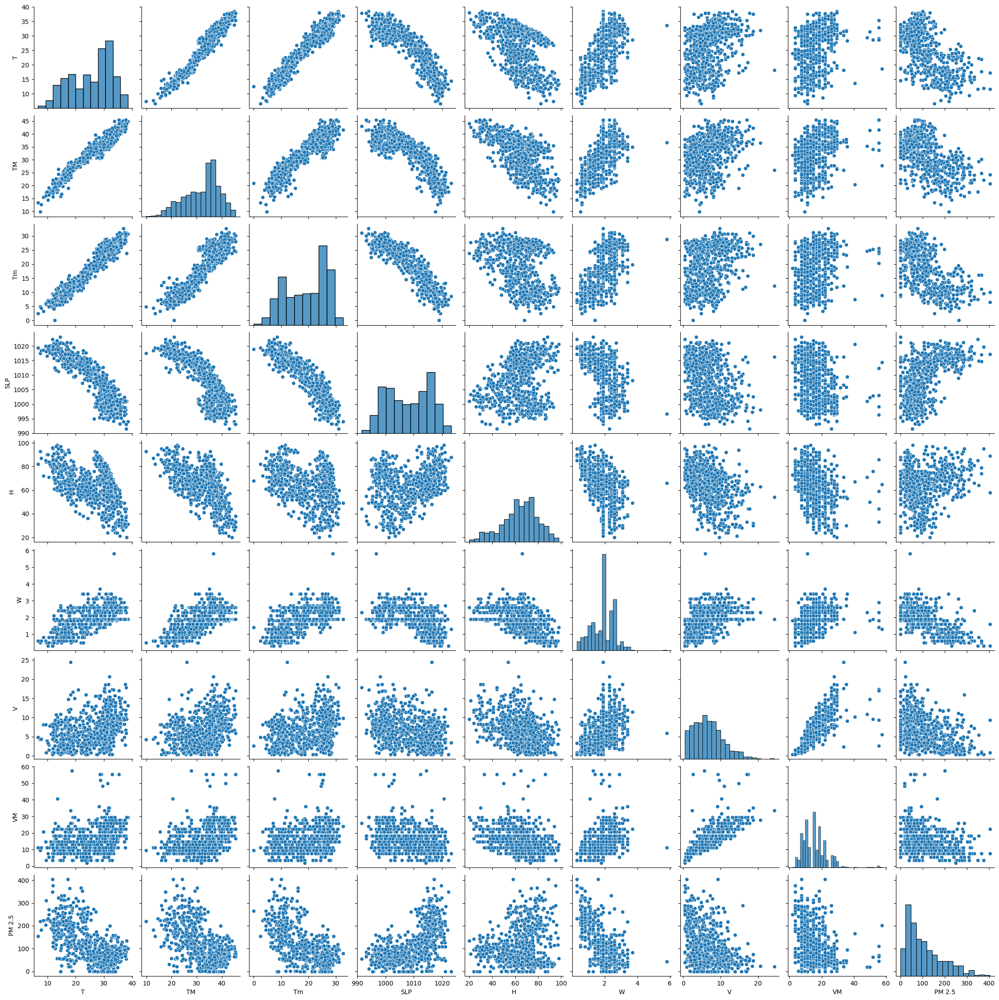

In [14]:
#Multivariate analysis using pairplot, comparing all features among each other
sns.pairplot(df)

In [15]:
#We dont have any set pattern with PM 2.5 and other features, so linear regression algorithm will not be the best choice
df.corr()

,T,TM,Tm,SLP,H,W,V,VM,PM 2.5
T,1.000000,0.967276,0.958892,-0.884383,-0.518870,0.622637,0.326067,0.287138,-0.628336
TM,0.967276,1.000000,0.896699,-0.829254,-0.599629,0.598479,0.320116,0.299508,-0.569381
Tm,0.958892,0.896699,1.000000,-0.909514,-0.315305,0.560299,0.312904,0.259431,-0.669059
SLP,-0.884383,-0.829254,-0.909514,1.000000,0.274196,-0.491842,-0.346130,-0.299830,0.615615
H,-0.518870,-0.599629,-0.315305,0.274196,1.000000,-0.475279,-0.399079,-0.370981,0.174658
W,0.622637,0.598479,0.560299,-0.491842,-0.475279,1.000000,0.402884,0.347493,-0.628621
V,0.326067,0.320116,0.312904,-0.346130,-0.399079,0.402884,1.000000,0.760777,-0.354799
VM,0.287138,0.299508,0.259431,-0.299830,-0.370981,0.347493,0.760777,1.000000,-0.283695
PM 2.5,-0.628336,-0.569381,-0.669059,0.615615,0.174658,-0.628621,-0.354799,-0.283695,1.000000


## Correlation Matrix with Heatmap ##
The correlation refers to how the features are related to each other or the target variable. It can either be positive (wherein an increase in the value of one feature increases the value of the target variable) or negative (increase in the value of one feature decreases the value of the target variable).

The heatmap is a tool that helps us identify which features are the most related to the target variable. We will plot the heatmap using the seabirn library.

<Axes: >

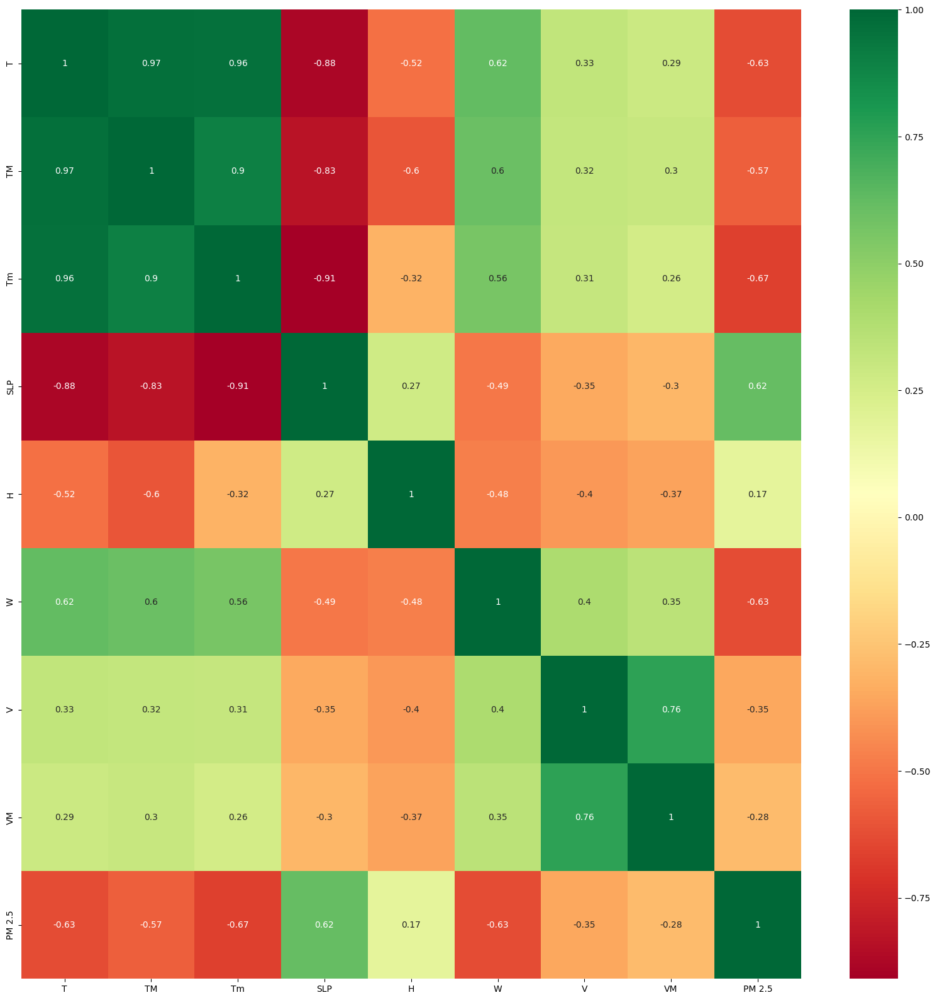

In [16]:
import seaborn as sns
correlation_matrix = df.corr()
top_cor_features = correlation_matrix.index
plt.figure(figsize=(20, 20))
#plot heat map
sns.heatmap(df[top_cor_features].corr(), annot = True, cmap = 'RdYlGn')

In [17]:
df.corr().index

Index(['T', 'TM', 'Tm', 'SLP', 'H', 'W', 'V', 'VM', 'PM 2.5'], dtype='object')

## Feature Importance ##
We can obtain the importance of each feature of our dataset by using the 'feature importance property' of the model.
The feature importance gives us a score for each feature of the data. The higher the score, the more relevant that feature towards the dependent feature.
Feature importance is an inbuilt class that is included in the Tree Based Regressor. We will be using the Extra Tree Regressor for retrieving the top 10 features

In [21]:
!pip install scikit-learn

  Using cached joblib-1.4.2-py3-none-any.whl.metadata (5.4 kB)
  Using cached threadpoolctl-3.5.0-py3-none-any.whl.metadata (13 kB)
   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 11.0/11.0 MB 14.1 MB/s eta 0:00:00 0:00:01
Using cached joblib-1.4.2-py3-none-any.whl (301 kB)
   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 23.1/23.1 MB 15.1 MB/s eta 0:00:00a 0:00:01
Using cached threadpoolctl-3.5.0-py3-none-any.whl (18 kB)


In [22]:
from sklearn.ensemble import ExtraTreesRegressor
import matplotlib.pyplot as plt
model = ExtraTreesRegressor()
model.fit(X,y)

ExtraTreesRegressor()

In [23]:
print(model.feature_importances_)


[0.16669712 0.08408658 0.14763808 0.15343491 0.08204836 0.2743895
 0.05282505 0.0388804 ]


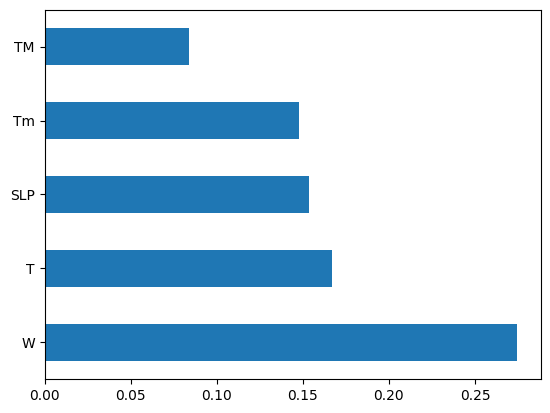

In [24]:
#plot the graph of feature importances to get which features are most important
feature_importances = pd.Series(model.feature_importances_, index=X.columns)
feature_importances.nlargest(5).plot(kind = 'barh')
plt.show()

## Linear Regression ##

/var/folders/qf/7j3lvnwx0xn_ltwl3rkzpt_w0000gn/T/ipykernel_44511/2063008122.py:1: UserWarning: 

`distplot` is a deprecated function and will be removed in seaborn v0.14.0.

Please adapt your code to use either `displot` (a figure-level function with
similar flexibility) or `histplot` (an axes-level function for histograms).

For a guide to updating your code to use the new functions, please see
https://gist.github.com/mwaskom/de44147ed2974457ad6372750bbe5751

  sns.distplot(y) #right skewed distribution graph


<Axes: xlabel='PM 2.5', ylabel='Density'>

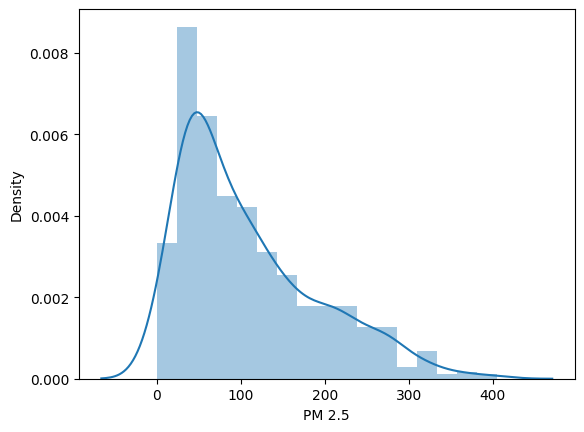

In [25]:
sns.distplot(y) #right skewed distribution graph

### Train Test Split

In [26]:
from sklearn.model_selection import train_test_split
X_train, X_test, y_train, y_test = train_test_split(X, y, test_size= 0.2, random_state=0)

In [27]:
from sklearn.linear_model import LinearRegression
regressor = LinearRegression()
regressor.fit(X_train, y_train)

LinearRegression()

In [28]:
regressor.coef_ #slope with respect to all independent features

array([  1.91864426,   0.60867784,  -6.93208313,   0.72161812,
        -0.81501081, -47.91320153,  -2.62389632,  -0.15629312])

In [29]:
#output where all independent features are 0
regressor.intercept_

np.float64(-390.2795959010748)

In [30]:
print("R2 score on train set:" , regressor.score(X_train, y_train))

R2 score on train set: 0.6023477193124958


In [31]:
print("R2 score on test set:" , regressor.score(X_test, y_test))


R2 score on test set: 0.47814199256563095


In [32]:
from sklearn.model_selection import cross_val_score #cross validation helps with different combinations of training and test sets
score = cross_val_score(regressor, X, y, cv = 5) #5 iterations
score.mean()

np.float64(0.46724362258523316)

### Model Evaluation ##

In [33]:
#get all coefficients
coeff_df = pd.DataFrame(regressor.coef_, X.columns, columns = ['Coefficient'])
coeff_df

,Coefficient
T,1.918644
TM,0.608678
Tm,-6.932083
SLP,0.721618
H,-0.815011
W,-47.913202
V,-2.623896
VM,-0.156293


Interpreting the coefficients:
1. Holding all other features fixed, a 1 unit increase in T is associated with an increase of 1.91 in AQI PM 2.5
2. Holding all other features fixed, a 1 unit increase in Tm is associated with a decrease off 6.93 in AQI PM 2.5

In [34]:
prediction = regressor.predict(X_test)

/var/folders/qf/7j3lvnwx0xn_ltwl3rkzpt_w0000gn/T/ipykernel_44511/2921611351.py:1: UserWarning: 

`distplot` is a deprecated function and will be removed in seaborn v0.14.0.

Please adapt your code to use either `displot` (a figure-level function with
similar flexibility) or `histplot` (an axes-level function for histograms).

For a guide to updating your code to use the new functions, please see
https://gist.github.com/mwaskom/de44147ed2974457ad6372750bbe5751

  sns.distplot(y_test-prediction) #This almost looks like a bell curve - this is good news!


<Axes: xlabel='PM 2.5', ylabel='Density'>

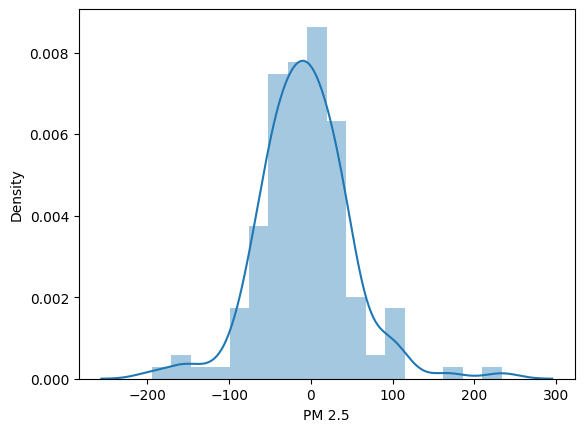

In [35]:
sns.distplot(y_test-prediction) #This almost looks like a bell curve - this is good news!

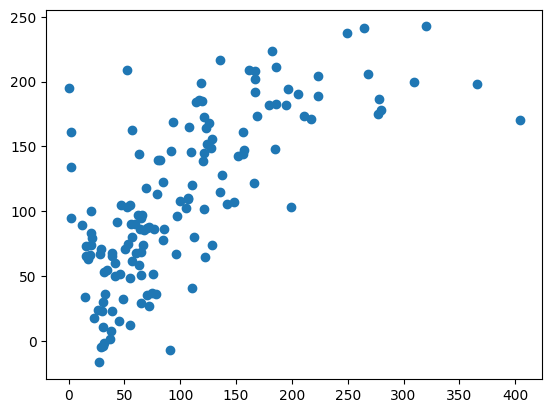

In [36]:
plt.scatter(y_test, prediction)

## Decision Tree Regressor ##

/var/folders/qf/7j3lvnwx0xn_ltwl3rkzpt_w0000gn/T/ipykernel_44511/476133659.py:1: UserWarning: 

`distplot` is a deprecated function and will be removed in seaborn v0.14.0.

Please adapt your code to use either `displot` (a figure-level function with
similar flexibility) or `histplot` (an axes-level function for histograms).

For a guide to updating your code to use the new functions, please see
https://gist.github.com/mwaskom/de44147ed2974457ad6372750bbe5751

  sns.distplot(y)


<Axes: xlabel='PM 2.5', ylabel='Density'>

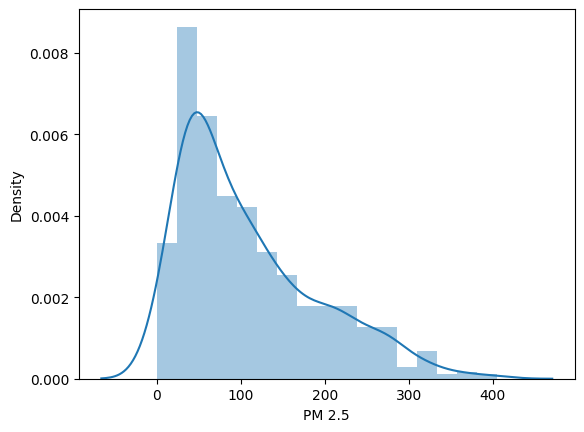

In [37]:
sns.distplot(y)

### Train Test Split ###

In [38]:
from sklearn.model_selection import train_test_split
X_train, X_test, y_train, y_test = train_test_split(X, y, test_size=0.2, random_state=0)

In [39]:
from sklearn.tree import DecisionTreeRegressor

In [40]:
dec_tree = DecisionTreeRegressor(criterion='friedman_mse')
dec_tree.fit(X_train, y_train)

DecisionTreeRegressor(criterion='friedman_mse')

In [41]:
print('Coefficient of determination R^2 on train set: {}'.format(dec_tree.score(X_train, y_train)))
#This is because the decision tree completely divides till the very last node if no other parameters are included in the model

Coefficient of determination R^2 on train set: 1.0


In [42]:
print('Coefficient of determination R^2 on test set: {}'.format(dec_tree.score(X_test, y_test))) #This is not good. Overfitting on training data!

Coefficient of determination R^2 on test set: 0.3395304172750937


In [43]:
from sklearn.model_selection import cross_val_score
score_dtree = cross_val_score(dec_tree, X, y, cv = 5)
score_dtree.mean()

np.float64(0.04485218517220555)

### Model Evaluation ###

In [44]:
prediction_dtree = dec_tree.predict(X_test)

/var/folders/qf/7j3lvnwx0xn_ltwl3rkzpt_w0000gn/T/ipykernel_44511/3991607286.py:1: UserWarning: 

`distplot` is a deprecated function and will be removed in seaborn v0.14.0.

Please adapt your code to use either `displot` (a figure-level function with
similar flexibility) or `histplot` (an axes-level function for histograms).

For a guide to updating your code to use the new functions, please see
https://gist.github.com/mwaskom/de44147ed2974457ad6372750bbe5751

  sns.distplot(y_test-prediction_dtree)


<Axes: xlabel='PM 2.5', ylabel='Density'>

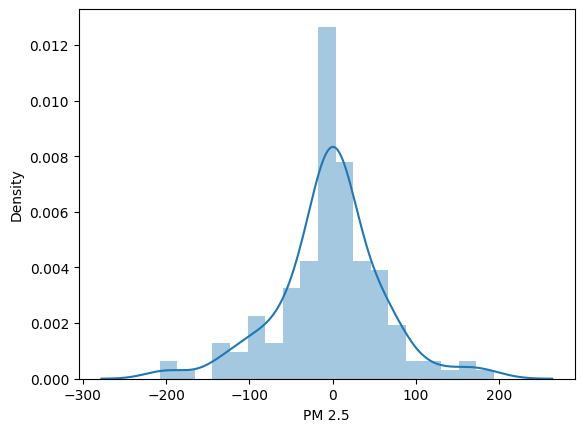

In [45]:
sns.distplot(y_test-prediction_dtree)

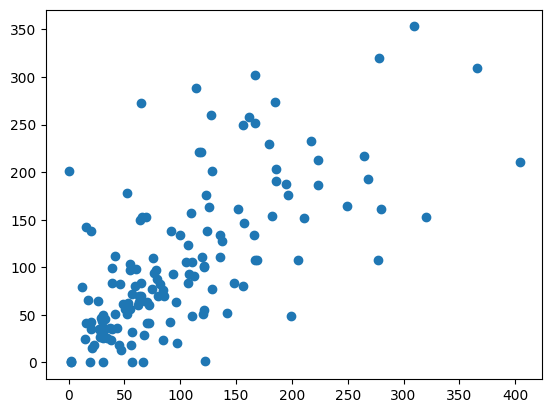

In [46]:
plt.scatter(y_test, prediction_dtree)

## Hyperparameter Tuning for Decision Tree Regressor ##

In [47]:
DecisionTreeRegressor()

DecisionTreeRegressor()

In [48]:
hyper_params = {
    "splitter": ["best", "random"],
    "max_depth": [3, 4, 5, 6, 8, 10, 12, 15],
    "min_samples_leaf": [1, 2, 3, 4, 5],
    "min_weight_fraction_leaf": [0.1, 0.2, 0.3, 0.4],
    "max_features": ["auto", "log2", "sqrt", None],
    "max_leaf_nodes": [None, 10, 20, 30, 40, 50, 60, 70]
}

In [49]:
#Hyperparameter optimization using GridSearchCV
from sklearn.model_selection import GridSearchCV
dtree_opt = GridSearchCV(dec_tree, param_grid=hyper_params, scoring="neg_mean_squared_error", n_jobs=-1, cv = 10, verbose = 3) #apply cross validation of 10

In [50]:
#creating a timer function to determine the time taken to train the model
import datetime
def timer(start_time = None):
    if not start_time:
        start_time = datetime.now()
        return start_time
    elif start_time:
        thour, temp_second = divmod((datetime.now()-start_time).total_seconds(), 3600)
        tmin, tsec = divmod(temp_second, 60)
        print('\n Time taken: %i hours %i minutes %s seconds.' % (thour, tmin, round(tsec, 2)))

In [52]:
from datetime import datetime
# Here we go
start_time = timer(None) # timing starts from this point for "start_time" variable
dtree_opt.fit(X,y)
timer(start_time) # timing ends here for "start_time" variable

Fitting 10 folds for each of 10240 candidates, totalling 102400 fits
[CV 1/10] END max_depth=3, max_features=auto, max_leaf_nodes=None, min_samples_leaf=1, min_weight_fraction_leaf=0.1, splitter=best;, score=nan total time=   0.0s[CV 4/10] END max_depth=3, max_features=auto, max_leaf_nodes=None, min_samples_leaf=1, min_weight_fraction_leaf=0.1, splitter=best;, score=nan total time=   0.0s

[CV 8/10] END max_depth=3, max_features=auto, max_leaf_nodes=None, min_samples_leaf=1, min_weight_fraction_leaf=0.1, splitter=best;, score=nan total time=   0.0s
[CV 3/10] END max_depth=3, max_features=auto, max_leaf_nodes=None, min_samples_leaf=1, min_weight_fraction_leaf=0.1, splitter=best;, score=nan total time=   0.0s
[CV 2/10] END max_depth=3, max_features=auto, max_leaf_nodes=None, min_samples_leaf=1, min_weight_fraction_leaf=0.1, splitter=best;, score=nan total time=   0.0s
[CV 7/10] END max_depth=3, max_features=auto, max_leaf_nodes=None, min_samples_leaf=1, min_weight_fraction_leaf=0.1, spli

/Users/palakprashant/AQI_Prediction/.venv/lib/python3.13/site-packages/sklearn/model_selection/_validation.py:540: FitFailedWarning: 
25600 fits failed out of a total of 102400.
The score on these train-test partitions for these parameters will be set to nan.
If these failures are not expected, you can try to debug them by setting error_score='raise'.

Below are more details about the failures:
--------------------------------------------------------------------------------
9599 fits failed with the following error:
Traceback (most recent call last):
  File "/Users/palakprashant/AQI_Prediction/.venv/lib/python3.13/site-packages/sklearn/model_selection/_validation.py", line 888, in _fit_and_score
    estimator.fit(X_train, y_train, **fit_params)
    ~~~~~~~~~~~~~^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^
  File "/Users/palakprashant/AQI_Prediction/.venv/lib/python3.13/site-packages/sklearn/base.py", line 1466, in wrapper
    estimator._validate_params()
    ~~~~~~~~~~~~~~~~~~~~~~~~~~^^
  File "/U


 Time taken: 0 hours 1 minutes 23.14 seconds.


/Users/palakprashant/AQI_Prediction/.venv/lib/python3.13/site-packages/sklearn/model_selection/_search.py:1103: UserWarning: One or more of the test scores are non-finite: [           nan            nan            nan ... -5892.98888823
 -4485.89917577 -6216.81592861]
  warnings.warn(


In [54]:
dtree_opt.best_params_ #parameters that are finally selected

{'max_depth': 6,
 'max_features': 'sqrt',
 'max_leaf_nodes': 30,
 'min_samples_leaf': 5,
 'min_weight_fraction_leaf': 0.1,
 'splitter': 'best'}

In [56]:
dtree_opt.best_score_ #this is the closest to 0

np.float64(-3088.9236432773014)

Hyperparameter tuning will always give us a generalized model and will never lead to overfitting.

/var/folders/qf/7j3lvnwx0xn_ltwl3rkzpt_w0000gn/T/ipykernel_44511/3202448364.py:1: UserWarning: 

`distplot` is a deprecated function and will be removed in seaborn v0.14.0.

Please adapt your code to use either `displot` (a figure-level function with
similar flexibility) or `histplot` (an axes-level function for histograms).

For a guide to updating your code to use the new functions, please see
https://gist.github.com/mwaskom/de44147ed2974457ad6372750bbe5751

  sns.distplot(y_test - prediction_dtree)


<Axes: xlabel='PM 2.5', ylabel='Density'>

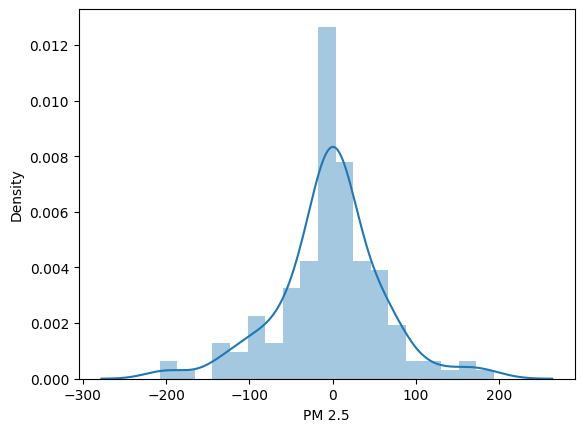

In [57]:
sns.distplot(y_test - prediction_dtree)

## Regression Evaluation Metrics ##
The following are the 3 common evaluation metrics for regression problems:
1. Mean Absolute Error (MAE): This is the mean of the absolute value of errors
2. Mean Squared Error (MSE): This is the mean of the squared errors
3. Root Mean Squared Error (RMSE): This is the root of the mean of the squared errors

Comparing the above 3:
1. MAE is the easiest to understand because it is the average of the errors.
2. MSE is more popular than MAE because it punishes large errors, which is helpful in the real world.
3. RMSE is even more popular than MSE, because it is interpretable in "y" units

All these evaluation metrics are loss functions because we want to minimize them.

In [59]:
from sklearn import metrics
print("MAE: ", metrics.mean_absolute_error(y_test, prediction_dtree))
print("MSE: ", metrics.mean_squared_error(y_test, prediction_dtree))
print("RMSE: ", np.sqrt(metrics.mean_squared_error(y_test, prediction_dtree)))
#This is a more generalized model - generally we would need to test on more amount of data

MAE:  43.45813356164384
MSE:  3974.319299253235
RMSE:  63.0422025253975


In [60]:
import pickle #using for deployment

In [61]:
# open a file, where you ant to store the data
file = open('decision_tree_regression_model.pkl', 'wb')

# dump information to that file
pickle.dump(dtree_opt, file)